# Telemetry Data for CI Clusters

Every cluster running an OpenShift CI job sends some operational data back to Red Hat via [Telemetry](https://docs.openshift.com/container-platform/4.7/support/remote_health_monitoring/about-remote-health-monitoring.html#telemetry-about-telemetry_about-remote-health-monitoring). This data gets stored as [Prometheus](https://prometheus.io/docs/introduction/overview/) metrics in a [Thanos](https://github.com/thanos-io/thanos) deployment at Red Hat. Some examples of the prometheus metrics collected here include CPU and memory capacity, operators installed, alerts fired, provider platform, etc. Thus, in addition to high level test run data on testgrid and prow, we also have detailed time series data available for the CI clusters that ran the tests.

In this notebook, we will show how to access this telemetry data using some open source tools developed by the AIOps team. Specifically we will show that, given a specific CI job run, how to get the telemetry data associated with the cluster that ran it.

**NOTE:** Since this data is currently hosted on a Red Hat internal Thanos, only those users with access to it will be able to run this notebook to get "live" data. To ensure that the wider open source community is also able to use this data for further analysis, we will use this notebook to extract a snippet of this data and save it on our public GitHub repo.

In [1]:
# import all the required libraries
import os
import warnings
import datetime as dt
from tqdm.notebook import tqdm
from IPython.display import display
from dotenv import load_dotenv, find_dotenv
from urllib3.exceptions import InsecureRequestWarning

import pandas as pd

from matplotlib import pyplot as plt
import seaborn as sns

from prometheus_api_client import (
    PrometheusConnect,
    MetricSnapshotDataFrame,
    MetricRangeDataFrame,
)

import sys

sys.path.insert(1, "../TestGrid/metrics")
from ipynb.fs.defs.metric_template import save_to_disk  # noqa: E402

load_dotenv(find_dotenv())

True

In [2]:
# config for a pretty notebook
sns.set()
load_dotenv(find_dotenv())
warnings.filterwarnings("ignore", category=InsecureRequestWarning)

## Data Access Setup

In this section, we will configure the [prometheus-api-client-python](https://github.com/AICoE/prometheus-api-client-python) tool to pull data from our Thanos instance. That is, set the value of `PROM_URL` to the Thanos endpoint, and set the value of `PROM_ACCESS_TOKEN` to the bearer token for authentication. We will also set the timestamp from which telemetry data is to be pulled.

In order to get access to the token, you can follow either one of these steps:
1. Visit `https://datahub.psi.redhat.com/`. Click on your profile (top right) and select Copy Login Command from the drop down menu. This will copy a command that will look something like: `oc login https://datahub.psi.redhat.com:443 --token=<YOUR_TOKEN>`. The value in YOUR_TOKEN is the required token.
2. From the command line, run `oc whoami --show-token`. Ensure that the output of `oc project` is `https://datahub.psi.redhat.com/`. This will output the required token.

**NOTE:** The above methods can only used if you are on Red Hat VPN.

In [3]:
# prometheus from which metrics are to be fetched
PROM_URL = os.getenv("PROM_URL")
PROM_ACCESS_TOKEN = os.getenv("PROM_ACCESS_TOKEN")

In [4]:
# prometheus connector object
pc = PrometheusConnect(
    url=PROM_URL,
    disable_ssl=True,
    headers={"Authorization": f"bearer {PROM_ACCESS_TOKEN}"},
)

In [6]:
# timestamp for which prometheus queries will be evaluated
#query_eval_time = dt.datetime.now(tz=dt.timezone.utc) - dt.timedelta(hours=6)
query_eval_time= dt.datetime(year=2021, month=10, day=28, hour=5, minute=52)
query_eval_ts = query_eval_time.timestamp()

In [7]:
# which metrics to fetch
# we will try to get all metrics, but leave out ones that may have potentially sensitive data
metrics_to_fetch = [
    m
    for m in pc.all_metrics()
    if "subscription" not in m and "internal" not in m and "url" not in m
]

In [8]:
# these fields are either irrelevant or contain something that could potentially be sensitive
# either way, these likely wont be useful for analysis anyway so exclude them when reading data
drop_cols = [
    "prometheus",
    "tenant_id",
    "endpoint",
    "instance",
    "receive",
    "url",
]

## Get All Data for a Given Job Build

In this section, we will get all the prometheus metrics corresponding to a given job name and build id. The job name and build id can be obtained either directly from the testgrid UI, or from the `query` and `changelists` fields respectively in the testgrid json as shown in the [testgrid metadata EDA notebook](../TestGrid/testgrid_metadata_EDA.ipynb).

One of the metrics stored in Thanos is `cluster_installer`. This metric describes what entity triggered the install of each cluster. For the clusters that run OpenShift CI jobs, the `invoker` label value in this metric is set to `openshift-internal-ci/{job_name}/{build_id}`.

Therefore, we can get all data for a given job build by first finding the ID of the cluster that ran it (using `cluster_installer`), and then querying prometheus for metrics where the `_id` label value equals this cluster ID. These steps are demonstrated through the example below.

In [9]:
# example job and build
job_name = "periodic-ci-openshift-release-master-ci-4.10-upgrade-from-stable-4.9-e2e-aws-ovn-upgrade"
build_id = "1453563234790412288"

In [10]:
# get installer info for the job/build
job_build_cluster_installer = pc.custom_query(
    query=f'cluster_installer{{invoker="openshift-internal-ci/{job_name}/{build_id}"}}',
    params={"time": query_eval_ts},
)

# extract cluster id out of the installer info metric
cluster_id = job_build_cluster_installer[0]["metric"]["_id"]

### Get One Metric

Before we fetch all the metrics, let's fetch just one metric and familiarize ourselves with the data format, and understand how to interpret it. In the cell below, we will look at an example metric, `cluster:cpu_capacity:sum`.

In [11]:
# fetch the metric and format it into a df
metric_df = MetricSnapshotDataFrame(
    pc.custom_query(
        query=f'cluster:capacity_cpu_cores:sum{{_id="{cluster_id}"}}',
        params={"time": query_eval_ts},
    )
)

# drop irrelavant data
metric_df.drop(columns=drop_cols, errors="ignore", inplace=True)

metric_df

,__name__,_id,label_beta_kubernetes_io_instance_type,label_kubernetes_io_arch,label_node_openshift_io_os_id,label_node_role_kubernetes_io,timestamp,value
0,cluster:capacity_cpu_cores:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,m5.xlarge,amd64,rhcos,master,1635400320,12
1,cluster:capacity_cpu_cores:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,m5.xlarge,amd64,rhcos,NaN,1635400320,12


**HOW TO READ THIS DATAFRAME**

In the above dataframe, each column represents a "label" of the prometheus metric, and each row represents a different "label configuration". In this example, the first row has `label_node_role_kubernetes_io` = `NaN` and `value` = `12`, and the second row has `label_node_role_kubernetes_io` = `master` and `value` = `12`. This means that in this cluster, the `master` node had 12 CPU cores, and the `worker` node also had 12 CPU cores.

To learn more about labels, label configurations, and the prometheus data model in general, please check out their official documentation [here](https://prometheus.io/docs/concepts/data_model/).

### Get All Metrics

Now that we understand the data structure of the metrics, let's fetch all the metrics and concatenate them into one single dataframe.

In [12]:
# let's combine all the metrics into one dataframe
# for the above mentioned job name and build name.
all_metrics_df = pd.DataFrame()
for metric in metrics_to_fetch:

    # fetch metric for the cluster
    metric_df = MetricSnapshotDataFrame(
        pc.custom_query(
            query=f'{metric}{{_id="{cluster_id}"}}',
            params={"time": query_eval_ts},
        )
    )

    if len(metric_df) > 0:
        # drop irrelevant cols, if any
        metric_df.drop(columns=drop_cols, errors="ignore", inplace=True)

        # show a glimpse of data
        print(f"Metric = {metric}")
        display(metric_df.head())

        # combine all the metrics data.
        all_metrics_df = pd.concat(
            [
                all_metrics_df,
                metric_df,
            ],
            axis=0,
            join="outer",
            ignore_index=True,
        )

Metric = alerts


,__name__,_id,alertname,alertstate,namespace,severity,timestamp,value
0,alerts,05c7768d-f769-4532-8f2e-5b93e0f1f84c,AlertmanagerReceiversNotConfigured,firing,openshift-monitoring,warning,1635400320,1
1,alerts,05c7768d-f769-4532-8f2e-5b93e0f1f84c,ExtremelyHighIndividualControlPlaneCPU,firing,openshift-kube-apiserver,critical,1635400320,1
2,alerts,05c7768d-f769-4532-8f2e-5b93e0f1f84c,HighOverallControlPlaneCPU,firing,openshift-kube-apiserver,warning,1635400320,1
3,alerts,05c7768d-f769-4532-8f2e-5b93e0f1f84c,Watchdog,firing,openshift-monitoring,none,1635400320,1


Metric = cco_credentials_mode


,__name__,_id,container,job,mode,namespace,pod,service,timestamp,value
0,cco_credentials_mode,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kube-rbac-proxy,cco-metrics,mint,openshift-cloud-credential-operator,cloud-credential-operator-87f58ddfc-79krp,cco-metrics,1635400320,1


Metric = cluster:alertmanager_integrations:max


,__name__,_id,timestamp,value
0,cluster:alertmanager_integrations:max,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,0


Metric = cluster:apiserver_current_inflight_requests:sum:max_over_time:2m


,__name__,_id,apiserver,timestamp,value
0,cluster:apiserver_current_inflight_requests:su...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kube-apiserver,1635400320,110
1,cluster:apiserver_current_inflight_requests:su...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,openshift-apiserver,1635400320,11


Metric = cluster:capacity_cpu_cores:sum


,__name__,_id,label_beta_kubernetes_io_instance_type,label_kubernetes_io_arch,label_node_openshift_io_os_id,label_node_role_kubernetes_io,timestamp,value
0,cluster:capacity_cpu_cores:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,m5.xlarge,amd64,rhcos,master,1635400320,12
1,cluster:capacity_cpu_cores:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,m5.xlarge,amd64,rhcos,NaN,1635400320,12


Metric = cluster:capacity_memory_bytes:sum


,__name__,_id,label_beta_kubernetes_io_instance_type,label_node_role_kubernetes_io,timestamp,value
0,cluster:capacity_memory_bytes:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,m5.xlarge,master,1635400320,49302392832
1,cluster:capacity_memory_bytes:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,m5.xlarge,NaN,1635400320,49478553600


Metric = cluster:cpu_usage_cores:sum


,__name__,_id,timestamp,value
0,cluster:cpu_usage_cores:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,15.02733333333334


Metric = cluster:kube_persistentvolume_plugin_type_counts:sum


,__name__,_id,plugin_name,volume_mode,timestamp,value
0,cluster:kube_persistentvolume_plugin_type_coun...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kubernetes.io/aws-ebs,Filesystem,1635400320,6
1,cluster:kube_persistentvolume_plugin_type_coun...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kubernetes.io/csi:csi-hostpath-e2e-ephemeral-3739,Filesystem,1635400320,1
2,cluster:kube_persistentvolume_plugin_type_coun...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kubernetes.io/csi:csi-mock-e2e-csi-mock-volume...,Filesystem,1635400320,1
3,cluster:kube_persistentvolume_plugin_type_coun...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kubernetes.io/local-volume,Filesystem,1635400320,2


Metric = cluster:kube_persistentvolumeclaim_resource_requests_storage_bytes:provisioner:sum


,__name__,_id,provisioner,timestamp,value
0,cluster:kube_persistentvolumeclaim_resource_re...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,csi-hostpath-e2e-ephemeral-3739,1635400320,1048576
1,cluster:kube_persistentvolumeclaim_resource_re...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,csi-mock-e2e-csi-mock-volumes-4802,1635400320,6442450944
2,cluster:kube_persistentvolumeclaim_resource_re...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,csi-mock-e2e-csi-mock-volumes-5837,1635400320,1073741824
3,cluster:kube_persistentvolumeclaim_resource_re...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kubernetes.io/aws-ebs,1635400320,24696061954
4,cluster:kube_persistentvolumeclaim_resource_re...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kubernetes.io/no-provisioner,1635400320,2147483648


Metric = cluster:kubelet_volume_stats_used_bytes:provisioner:sum


,__name__,_id,provisioner,timestamp,value
0,cluster:kubelet_volume_stats_used_bytes:provis...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,csi-mock-e2e-csi-mock-volumes-4802,1635400320,0
1,cluster:kubelet_volume_stats_used_bytes:provis...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kubernetes.io/aws-ebs,1635400320,709324800


Metric = cluster:memory_usage_bytes:sum


,__name__,_id,timestamp,value
0,cluster:memory_usage_bytes:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,43215560704


Metric = cluster:network_attachment_definition_enabled_instance_up:max


,__name__,_id,networks,timestamp,value
0,cluster:network_attachment_definition_enabled_...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,any,1635400320,0
1,cluster:network_attachment_definition_enabled_...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,ib-sriov,1635400320,0
2,cluster:network_attachment_definition_enabled_...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,sriov,1635400320,0


Metric = cluster:network_attachment_definition_instances:max


,__name__,_id,networks,timestamp,value
0,cluster:network_attachment_definition_instance...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,any,1635400320,0
1,cluster:network_attachment_definition_instance...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,ib-sriov,1635400320,0
2,cluster:network_attachment_definition_instance...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,sriov,1635400320,0


Metric = cluster:node_instance_type_count:sum


,__name__,_id,label_beta_kubernetes_io_instance_type,label_kubernetes_io_arch,label_node_openshift_io_os_id,label_node_role_kubernetes_io,timestamp,value
0,cluster:node_instance_type_count:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,m5.xlarge,amd64,rhcos,master,1635400320,3
1,cluster:node_instance_type_count:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,m5.xlarge,amd64,rhcos,NaN,1635400320,3


Metric = cluster:telemetry_selected_series:count


,__name__,_id,timestamp,value
0,cluster:telemetry_selected_series:count,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,542


Metric = cluster:usage:containers:sum


,__name__,_id,timestamp,value
0,cluster:usage:containers:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,2162


Metric = cluster:usage:ingress_frontend_bytes_in:rate5m:sum


,__name__,_id,timestamp,value
0,cluster:usage:ingress_frontend_bytes_in:rate5m...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,146.65925925925927


Metric = cluster:usage:ingress_frontend_bytes_out:rate5m:sum


,__name__,_id,timestamp,value
0,cluster:usage:ingress_frontend_bytes_out:rate5...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,811.9777777777779


Metric = cluster:usage:ingress_frontend_connections:sum


,__name__,_id,timestamp,value
0,cluster:usage:ingress_frontend_connections:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,10


Metric = cluster:usage:kube_node_ready:avg5m


,__name__,_id,timestamp,value
0,cluster:usage:kube_node_ready:avg5m,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,1


Metric = cluster:usage:kube_schedulable_node_ready_reachable:avg5m


,__name__,_id,timestamp,value
0,cluster:usage:kube_schedulable_node_ready_reac...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,1


Metric = cluster:usage:openshift:ingress_request_error:fraction5m


,__name__,_id,timestamp,value
0,cluster:usage:openshift:ingress_request_error:...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,0


Metric = cluster:usage:openshift:ingress_request_total:irate5m


,__name__,_id,timestamp,value
0,cluster:usage:openshift:ingress_request_total:...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,0.03333333333333333


Metric = cluster:usage:openshift:kube_running_pod_ready:avg


,__name__,_id,timestamp,value
0,cluster:usage:openshift:kube_running_pod_ready...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,1


Metric = cluster:usage:resources:sum


,__name__,_id,resource,timestamp,value
0,cluster:usage:resources:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,alertmanagerconfigs.monitoring.coreos.com,1635400320,0
1,cluster:usage:resources:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,alertmanagers.monitoring.coreos.com,1635400320,1
2,cluster:usage:resources:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,apirequestcounts.apiserver.openshift.io,1635400320,203
3,cluster:usage:resources:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,apiservers.config.openshift.io,1635400320,1
4,cluster:usage:resources:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,apiservices.apiregistration.k8s.io,1635400320,74


Metric = cluster:usage:workload:capacity_physical_cpu_core_seconds


,__name__,_id,timestamp,value
0,cluster:usage:workload:capacity_physical_cpu_c...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,10908


Metric = cluster:usage:workload:capacity_physical_cpu_cores:max:5m


,__name__,_id,timestamp,value
0,cluster:usage:workload:capacity_physical_cpu_c...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,6


Metric = cluster:usage:workload:capacity_physical_cpu_cores:min:5m


,__name__,_id,timestamp,value
0,cluster:usage:workload:capacity_physical_cpu_c...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,6


Metric = cluster:usage:workload:ingress_request_error:fraction5m


,__name__,_id,timestamp,value
0,cluster:usage:workload:ingress_request_error:f...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,0


Metric = cluster:usage:workload:ingress_request_total:irate5m


,__name__,_id,timestamp,value
0,cluster:usage:workload:ingress_request_total:i...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,0


Metric = cluster:usage:workload:kube_running_pod_ready:avg


,__name__,_id,timestamp,value
0,cluster:usage:workload:kube_running_pod_ready:avg,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,0.8235294117647057


Metric = cluster:virt_platform_nodes:sum


,__name__,_id,type,timestamp,value
0,cluster:virt_platform_nodes:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,aws,1635400320,6
1,cluster:virt_platform_nodes:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kvm,1635400320,6


Metric = cluster_feature_set


,__name__,_id,container,job,namespace,pod,service,timestamp,value
0,cluster_feature_set,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kube-apiserver-operator,metrics,openshift-kube-apiserver-operator,kube-apiserver-operator-68f988fb56-c9hf2,metrics,1635400320,1


Metric = cluster_infrastructure_provider


,__name__,_id,container,job,namespace,pod,region,service,type,timestamp,value
0,cluster_infrastructure_provider,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kube-apiserver-operator,metrics,openshift-kube-apiserver-operator,kube-apiserver-operator-68f988fb56-c9hf2,us-west-2,metrics,AWS,1635400320,1


Metric = cluster_installer


,__name__,_id,invoker,job,namespace,pod,service,type,version,timestamp,value
0,cluster_installer,05c7768d-f769-4532-8f2e-5b93e0f1f84c,openshift-internal-ci/periodic-ci-openshift-re...,cluster-version-operator,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,cluster-version-operator,openshift-install,v4.9.0,1635400320,1


Metric = cluster_legacy_scheduler_policy


,__name__,_id,job,namespace,pod,service,timestamp,value
0,cluster_legacy_scheduler_policy,05c7768d-f769-4532-8f2e-5b93e0f1f84c,metrics,openshift-kube-scheduler-operator,openshift-kube-scheduler-operator-58c4b8bfc4-8...,metrics,1635400320,0


Metric = cluster_master_schedulable


,__name__,_id,job,namespace,pod,service,timestamp,value
0,cluster_master_schedulable,05c7768d-f769-4532-8f2e-5b93e0f1f84c,metrics,openshift-kube-scheduler-operator,openshift-kube-scheduler-operator-58c4b8bfc4-8...,metrics,1635400320,0


Metric = cluster_operator_conditions


,__name__,_id,condition,job,name,namespace,pod,reason,service,timestamp,value
0,cluster_operator_conditions,05c7768d-f769-4532-8f2e-5b93e0f1f84c,Available,cluster-version-operator,authentication,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,AsExpected,cluster-version-operator,1635400320,1
1,cluster_operator_conditions,05c7768d-f769-4532-8f2e-5b93e0f1f84c,Available,cluster-version-operator,baremetal,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,AsExpected,cluster-version-operator,1635400320,1
2,cluster_operator_conditions,05c7768d-f769-4532-8f2e-5b93e0f1f84c,Available,cluster-version-operator,cloud-controller-manager,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,AsExpected,cluster-version-operator,1635400320,1
3,cluster_operator_conditions,05c7768d-f769-4532-8f2e-5b93e0f1f84c,Available,cluster-version-operator,cloud-credential,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,NaN,cluster-version-operator,1635400320,1
4,cluster_operator_conditions,05c7768d-f769-4532-8f2e-5b93e0f1f84c,Available,cluster-version-operator,cluster-api,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,AsExpected,cluster-version-operator,1635400320,1


Metric = cluster_operator_up


,__name__,_id,job,name,namespace,pod,service,version,timestamp,value
0,cluster_operator_up,05c7768d-f769-4532-8f2e-5b93e0f1f84c,cluster-version-operator,authentication,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,cluster-version-operator,4.10.0-0.ci-2021-10-28-032140,1635400320,1
1,cluster_operator_up,05c7768d-f769-4532-8f2e-5b93e0f1f84c,cluster-version-operator,baremetal,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,cluster-version-operator,4.10.0-0.ci-2021-10-28-032140,1635400320,1
2,cluster_operator_up,05c7768d-f769-4532-8f2e-5b93e0f1f84c,cluster-version-operator,cloud-controller-manager,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,cluster-version-operator,4.10.0-0.ci-2021-10-28-032140,1635400320,1
3,cluster_operator_up,05c7768d-f769-4532-8f2e-5b93e0f1f84c,cluster-version-operator,cloud-credential,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,cluster-version-operator,4.10.0-0.ci-2021-10-28-032140,1635400320,1
4,cluster_operator_up,05c7768d-f769-4532-8f2e-5b93e0f1f84c,cluster-version-operator,cluster-api,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,cluster-version-operator,4.10.0-0.ci-2021-10-28-032140,1635400320,1


Metric = cluster_version


,__name__,_id,from_version,image,job,namespace,pod,service,type,version,timestamp,value
0,cluster_version,05c7768d-f769-4532-8f2e-5b93e0f1f84c,4.10.0-0.ci-2021-10-28-032140,registry.build01.ci.openshift.org/ci-op-fjrbsc...,cluster-version-operator,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,cluster-version-operator,current,4.10.0-0.ci-2021-10-28-032140,1635400320,1635391376
1,cluster_version,05c7768d-f769-4532-8f2e-5b93e0f1f84c,4.9.5,registry.build01.ci.openshift.org/ci-op-fjrbsc...,cluster-version-operator,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,cluster-version-operator,cluster,4.10.0-0.ci-2021-10-28-032140,1635400320,1635392372
2,cluster_version,05c7768d-f769-4532-8f2e-5b93e0f1f84c,4.9.5,registry.build01.ci.openshift.org/ci-op-fjrbsc...,cluster-version-operator,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,cluster-version-operator,completed,4.10.0-0.ci-2021-10-28-032140,1635400320,1635399004
3,cluster_version,05c7768d-f769-4532-8f2e-5b93e0f1f84c,NaN,registry.build01.ci.openshift.org/ci-op-fjrbsc...,cluster-version-operator,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,cluster-version-operator,initial,4.9.5,1635400320,1635392372


Metric = cluster_version_payload


,__name__,_id,job,namespace,pod,service,type,version,timestamp,value
0,cluster_version_payload,05c7768d-f769-4532-8f2e-5b93e0f1f84c,cluster-version-operator,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,cluster-version-operator,applied,4.10.0-0.ci-2021-10-28-032140,1635400320,768
1,cluster_version_payload,05c7768d-f769-4532-8f2e-5b93e0f1f84c,cluster-version-operator,openshift-cluster-version,cluster-version-operator-8858dcf87-jf86b,cluster-version-operator,pending,4.10.0-0.ci-2021-10-28-032140,1635400320,0


Metric = code:apiserver_request_total:rate:sum


,__name__,_id,code,timestamp,value
0,code:apiserver_request_total:rate:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,0,1635400320,12.82660474134325
1,code:apiserver_request_total:rate:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,200,1635400320,428.5331577897873
2,code:apiserver_request_total:rate:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,201,1635400320,71.76454381770007
3,code:apiserver_request_total:rate:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,204,1635400320,0.007017543859649122
4,code:apiserver_request_total:rate:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,301,1635400320,0


Metric = count:up1


,__name__,_id,apiserver,job,namespace,service,timestamp,value,container,metrics_path
0,count:up1,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kube-apiserver,apiserver,default,kubernetes,1635400320,3,NaN,NaN
1,count:up1,05c7768d-f769-4532-8f2e-5b93e0f1f84c,openshift-apiserver,api,openshift-apiserver,api,1635400320,3,openshift-apiserver,NaN
2,count:up1,05c7768d-f769-4532-8f2e-5b93e0f1f84c,NaN,aws-ebs-csi-driver-controller-metrics,openshift-cluster-csi-drivers,aws-ebs-csi-driver-controller-metrics,1635400320,2,attacher-kube-rbac-proxy,NaN
3,count:up1,05c7768d-f769-4532-8f2e-5b93e0f1f84c,NaN,catalog-operator-metrics,openshift-operator-lifecycle-manager,catalog-operator-metrics,1635400320,1,catalog-operator,NaN
4,count:up1,05c7768d-f769-4532-8f2e-5b93e0f1f84c,NaN,network-check-source,openshift-network-diagnostics,network-check-source,1635400320,1,check-endpoints,NaN


Metric = csv_succeeded


,__name__,_id,container,exported_namespace,job,name,namespace,pod,service,version,timestamp,value
0,csv_succeeded,05c7768d-f769-4532-8f2e-5b93e0f1f84c,olm-operator,openshift-operator-lifecycle-manager,olm-operator-metrics,packageserver,openshift-operator-lifecycle-manager,olm-operator-74dd4cb5f-z84z5,olm-operator-metrics,0.18.3,1635400320,1


Metric = id_install_type


,__name__,_id,install_type,timestamp,value
0,id_install_type,05c7768d-f769-4532-8f2e-5b93e0f1f84c,ipi,1635400320,0


Metric = id_network_type


,__name__,_id,network_type,timestamp,value
0,id_network_type,05c7768d-f769-4532-8f2e-5b93e0f1f84c,OVNKube,1635400320,1


Metric = id_primary_host_type


,__name__,_id,host_type,timestamp,value
0,id_primary_host_type,05c7768d-f769-4532-8f2e-5b93e0f1f84c,aws,1635400320,0


Metric = id_provider


,__name__,_id,provider,timestamp,value
0,id_provider,05c7768d-f769-4532-8f2e-5b93e0f1f84c,AWS,1635400320,0


Metric = id_version


,__name__,_id,version,timestamp,value
0,id_version,05c7768d-f769-4532-8f2e-5b93e0f1f84c,4.10.0-0.ci-2021-10-28-032140,1635400320,0


Metric = id_version:cluster_available


,__name__,_id,version,timestamp,value
0,id_version:cluster_available,05c7768d-f769-4532-8f2e-5b93e0f1f84c,4.10.0-0.ci-2021-10-28-032140,1635400320,1


Metric = insightsclient_request_send_total


,__name__,_id,client,container,job,namespace,pod,service,status_code,timestamp,value
0,insightsclient_request_send_total,05c7768d-f769-4532-8f2e-5b93e0f1f84c,default,insights-operator,metrics,openshift-insights,insights-operator-bdb547f7d-hpcxv,metrics,202,1635400320,2


Metric = instance:etcd_disk_backend_commit_duration_seconds:histogram_quantile


,__name__,_id,quantile,timestamp,value
0,instance:etcd_disk_backend_commit_duration_sec...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,0.99,1635400320,0.0158528735632184
1,instance:etcd_disk_backend_commit_duration_sec...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,0.99,1635400320,0.013428363636363606
2,instance:etcd_disk_backend_commit_duration_sec...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,0.99,1635400320,0.018364444444444027


Metric = instance:etcd_disk_wal_fsync_duration_seconds:histogram_quantile


,__name__,_id,quantile,timestamp,value
0,instance:etcd_disk_wal_fsync_duration_seconds:...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,0.99,1635400320,0.012778404074702859
1,instance:etcd_disk_wal_fsync_duration_seconds:...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,0.99,1635400320,0.007262789915966411
2,instance:etcd_disk_wal_fsync_duration_seconds:...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,0.99,1635400320,0.013620484076433126


Metric = instance:etcd_mvcc_db_total_size_in_bytes:sum


,__name__,_id,timestamp,value
0,instance:etcd_mvcc_db_total_size_in_bytes:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,340590592
1,instance:etcd_mvcc_db_total_size_in_bytes:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,340348928
2,instance:etcd_mvcc_db_total_size_in_bytes:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,340963328


Metric = instance:etcd_mvcc_db_total_size_in_use_in_bytes:sum


,__name__,_id,timestamp,value
0,instance:etcd_mvcc_db_total_size_in_use_in_byt...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,273412096
1,instance:etcd_mvcc_db_total_size_in_use_in_byt...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,276733952
2,instance:etcd_mvcc_db_total_size_in_use_in_byt...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,269926400


Metric = instance:etcd_network_peer_round_trip_time_seconds:histogram_quantile


,__name__,_id,quantile,timestamp,value
0,instance:etcd_network_peer_round_trip_time_sec...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,0.99,1635400320,0.025245538461538465
1,instance:etcd_network_peer_round_trip_time_sec...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,0.99,1635400320,0.025181090909090913
2,instance:etcd_network_peer_round_trip_time_sec...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,0.99,1635400320,0.025344000000000002


Metric = instance:etcd_object_counts:sum


,__name__,_id,timestamp,value
0,instance:etcd_object_counts:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,21014
1,instance:etcd_object_counts:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,20853
2,instance:etcd_object_counts:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,21130
3,instance:etcd_object_counts:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,520
4,instance:etcd_object_counts:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,520


Metric = monitoring:container_memory_working_set_bytes:sum


,__name__,_id,namespace,timestamp,value
0,monitoring:container_memory_working_set_bytes:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,openshift-monitoring,1635400320,8992776192


Metric = monitoring:haproxy_server_http_responses_total:sum


,__name__,_id,exported_service,timestamp,value
0,monitoring:haproxy_server_http_responses_total...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,alertmanager-main,1635400320,0
1,monitoring:haproxy_server_http_responses_total...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,grafana,1635400320,0
2,monitoring:haproxy_server_http_responses_total...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,prometheus-k8s,1635400320,0


Metric = namespace_job:scrape_samples_post_metric_relabeling:topk3


,__name__,_id,job,namespace,timestamp,value
0,namespace_job:scrape_samples_post_metric_relab...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,apiserver,default,1635400320,32570
1,namespace_job:scrape_samples_post_metric_relab...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kube-controller-manager,openshift-kube-controller-manager,1635400320,23789
2,namespace_job:scrape_samples_post_metric_relab...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kube-state-metrics,openshift-monitoring,1635400320,19544


Metric = namespace_job:scrape_series_added:topk3_sum1h


,__name__,_id,job,namespace,timestamp,value
0,namespace_job:scrape_series_added:topk3_sum1h,05c7768d-f769-4532-8f2e-5b93e0f1f84c,apiserver,default,1635400320,128306
1,namespace_job:scrape_series_added:topk3_sum1h,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kube-state-metrics,openshift-monitoring,1635400320,83630
2,namespace_job:scrape_series_added:topk3_sum1h,05c7768d-f769-4532-8f2e-5b93e0f1f84c,kubelet,kube-system,1635400320,247448


Metric = node_role_os_version_machine:cpu_capacity_cores:sum


,__name__,_id,label_kubernetes_io_arch,label_node_hyperthread_enabled,label_node_openshift_io_os_id,label_node_role_kubernetes_io_master,timestamp,value
0,node_role_os_version_machine:cpu_capacity_core...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,amd64,true,rhcos,true,1635400320,6
1,node_role_os_version_machine:cpu_capacity_core...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,amd64,true,rhcos,NaN,1635400320,6


Metric = node_role_os_version_machine:cpu_capacity_sockets:sum


,__name__,_id,label_kubernetes_io_arch,label_node_hyperthread_enabled,label_node_openshift_io_os_id,label_node_role_kubernetes_io_master,timestamp,value
0,node_role_os_version_machine:cpu_capacity_sock...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,amd64,true,rhcos,true,1635400320,3
1,node_role_os_version_machine:cpu_capacity_sock...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,amd64,true,rhcos,NaN,1635400320,3


Metric = openshift:cpu_usage_cores:sum


,__name__,_id,timestamp,value
0,openshift:cpu_usage_cores:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,14.506954595175461


Metric = openshift:memory_usage_bytes:sum


,__name__,_id,timestamp,value
0,openshift:memory_usage_bytes:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,42004516864


Metric = openshift:prometheus_tsdb_head_samples_appended_total:sum


,__name__,_id,job,namespace,timestamp,value
0,openshift:prometheus_tsdb_head_samples_appende...,05c7768d-f769-4532-8f2e-5b93e0f1f84c,prometheus-k8s,openshift-monitoring,1635400320,19144.258607576965


Metric = openshift:prometheus_tsdb_head_series:sum


,__name__,_id,job,namespace,timestamp,value
0,openshift:prometheus_tsdb_head_series:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,prometheus-k8s,openshift-monitoring,1635400320,1569871


Metric = workload:cpu_usage_cores:sum


,__name__,_id,timestamp,value
0,workload:cpu_usage_cores:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,0.520378738157878


Metric = workload:memory_usage_bytes:sum


,__name__,_id,timestamp,value
0,workload:memory_usage_bytes:sum,05c7768d-f769-4532-8f2e-5b93e0f1f84c,1635400320,1211043840


In [13]:
# peak into the combined data df
with pd.option_context("display.max_columns", 50):
    display(all_metrics_df.head())

,__name__,_id,alertname,alertstate,namespace,severity,timestamp,value,container,job,mode,pod,service,apiserver,label_beta_kubernetes_io_instance_type,label_kubernetes_io_arch,label_node_openshift_io_os_id,label_node_role_kubernetes_io,plugin_name,volume_mode,provisioner,networks,resource,type,region,invoker,version,condition,name,reason,from_version,image,code,metrics_path,exported_namespace,install_type,network_type,host_type,provider,client,status_code,quantile,exported_service,label_node_hyperthread_enabled,label_node_role_kubernetes_io_master
0,alerts,05c7768d-f769-4532-8f2e-5b93e0f1f84c,AlertmanagerReceiversNotConfigured,firing,openshift-monitoring,warning,1635400320,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,alerts,05c7768d-f769-4532-8f2e-5b93e0f1f84c,ExtremelyHighIndividualControlPlaneCPU,firing,openshift-kube-apiserver,critical,1635400320,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,alerts,05c7768d-f769-4532-8f2e-5b93e0f1f84c,HighOverallControlPlaneCPU,firing,openshift-kube-apiserver,warning,1635400320,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,alerts,05c7768d-f769-4532-8f2e-5b93e0f1f84c,Watchdog,firing,openshift-monitoring,none,1635400320,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,cco_credentials_mode,05c7768d-f769-4532-8f2e-5b93e0f1f84c,NaN,NaN,openshift-cloud-credential-operator,NaN,1635400320,1,kube-rbac-proxy,cco-metrics,mint,cloud-credential-operator-87f58ddfc-79krp,cco-metrics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Get Data for Multiple Builds for a Given Job

In this section, we will fetch all the telemetry metrics from all timestamps for the top 10 most recent builds for a given job. This data can help understand how the behavior of the available metrics changed over time, across builds.

In [14]:
# fetch data from this number of builds for this job
NBUILDS = 10

# number of previous days of data to search to get the last n builds data for this job
NDAYS = 2

# max runtime of a build
# NOTE: this is a (over)estimate number derived from SME conversations, as well as time duration from testgrid
MAX_DURATION_HRS = 12

In [15]:
# get invoker details
prev_ndays_invokers = MetricRangeDataFrame(
    pc.custom_query_range(
        query=f'max by (_id, invoker) (cluster_installer{{invoker=~"^openshift-internal-ci/{job_name}.*"}})',
        end_time=query_eval_time,
        start_time=query_eval_time - dt.timedelta(days=NDAYS),
        step="5m",
    )
).sort_index()

# split invoker name into prefix, job id, build id.
prev_ndays_invokers[["prefix", "job_name", "build_id"]] = prev_ndays_invokers[
    "invoker"
].str.split("/", expand=True)

# drop now redundant columns.
prev_ndays_invokers.drop(columns=["invoker", "prefix", "value"], inplace=True)

# drop irrelevant columns.
prev_ndays_invokers.drop(columns=drop_cols, errors="ignore", inplace=True)

prev_ndays_invokers.head()

,_id,job_name,build_id
timestamp,,,
1635227400,775a8f81-51be-4a64-8bae-466d587e2c37,periodic-ci-openshift-release-master-ci-4.10-u...,1452867545852809216
1635227400,64377287-1d95-40fd-8ceb-3eadbf16f8e1,periodic-ci-openshift-release-master-ci-4.10-u...,1452867547534725120
1635227700,775a8f81-51be-4a64-8bae-466d587e2c37,periodic-ci-openshift-release-master-ci-4.10-u...,1452867545852809216
1635227700,0e8218c3-6f0c-4553-8d11-3499bdd223c2,periodic-ci-openshift-release-master-ci-4.10-u...,1452867552580472832
1635227700,d2e4d8a1-f60d-4a5b-b616-3d1e90b08498,periodic-ci-openshift-release-master-ci-4.10-u...,1452867527439814656


In [16]:
# for each build, get cluster id and then the corresponding metrics from all timestamps
all_metrics_df = pd.DataFrame()

for build_id in tqdm(prev_ndays_invokers["build_id"].unique()[:NBUILDS]):

    job_build_cluster_installer = pc.custom_query_range(
        query=f'cluster_installer{{invoker="openshift-internal-ci/{job_name}/{build_id}"}}',
        end_time=query_eval_time,
        start_time=query_eval_time
        - dt.timedelta(days=NDAYS)
        - dt.timedelta(days=MAX_DURATION_HRS),
        step="5m",
    )

    # extract cluster id out of the installer info metric
    cluster_id = job_build_cluster_installer[0]["metric"]["_id"]

    # get all telemetry time series
    for metric in metrics_to_fetch:

        # fetch the metric
        metric_result = pc.custom_query_range(
            query=f'{metric}{{_id="{cluster_id}"}}',
            end_time=query_eval_time,
            start_time=query_eval_time
            - dt.timedelta(days=NDAYS)
            - dt.timedelta(days=MAX_DURATION_HRS),
            step="5m",
        )

        if len(metric_result) > 0:
            metric_df = MetricRangeDataFrame(metric_result).reset_index(drop=False)

            # drop irrelevant cols, if any
            metric_df.drop(columns=drop_cols, errors="ignore", inplace=True)

            # combine all the metrics data.
            all_metrics_df = pd.concat(
                [
                    all_metrics_df,
                    metric_df,
                ],
                axis=0,
                join="outer",
                ignore_index=True,
            )

all_metrics_df["value"] = all_metrics_df["value"].astype(float)

  0%|          | 0/10 [00:00<?, ?it/s]

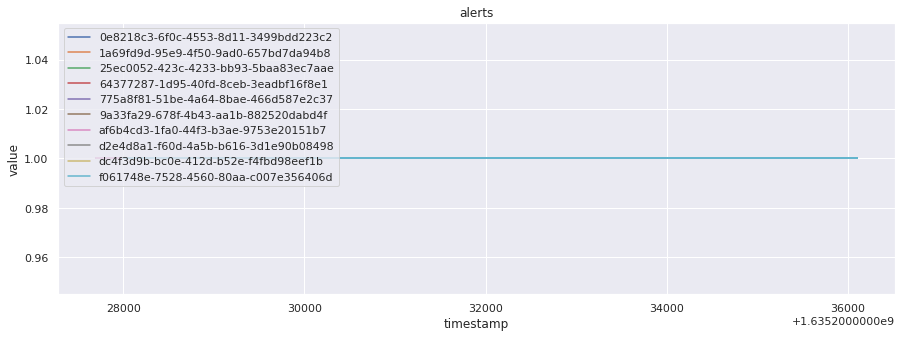

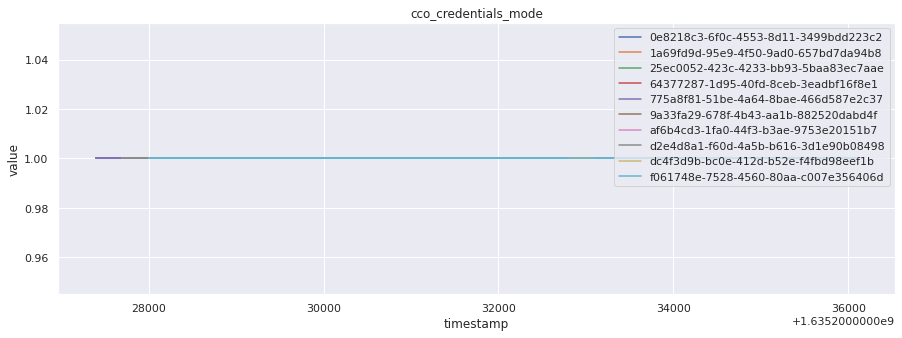

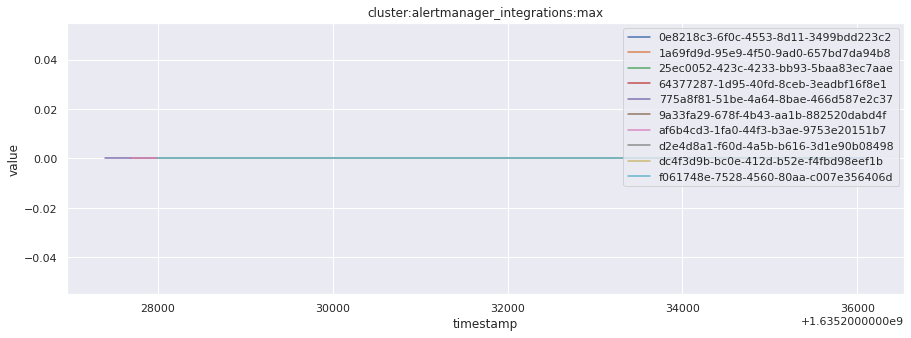

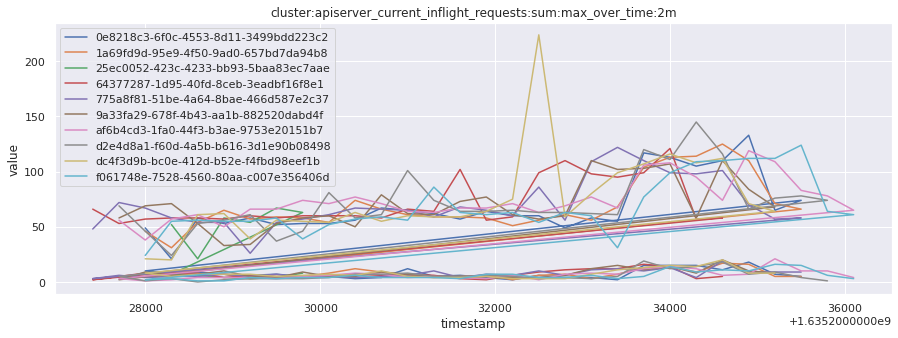

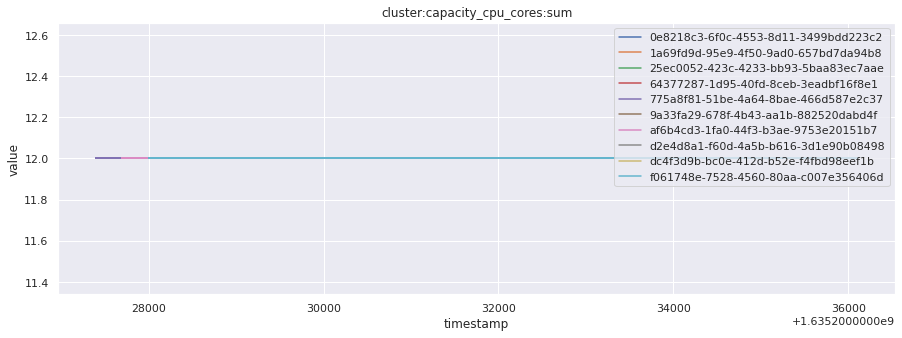

...

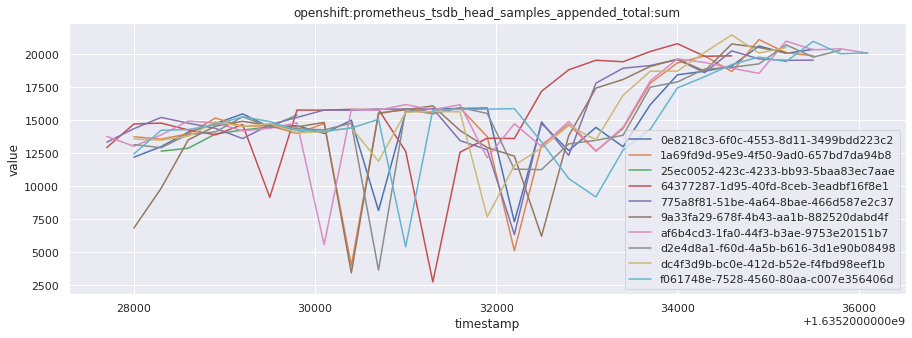

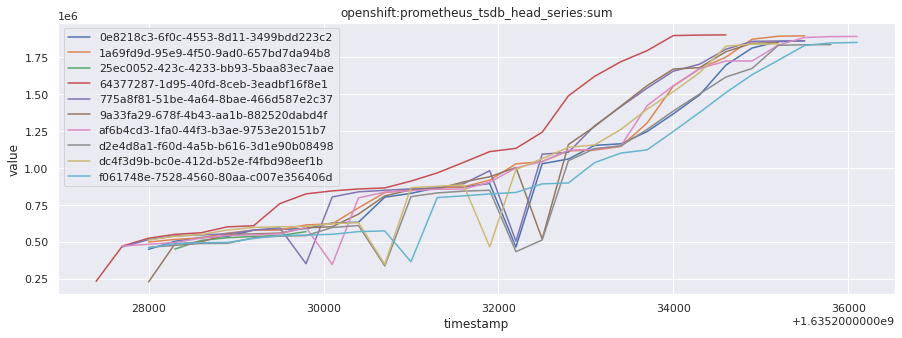

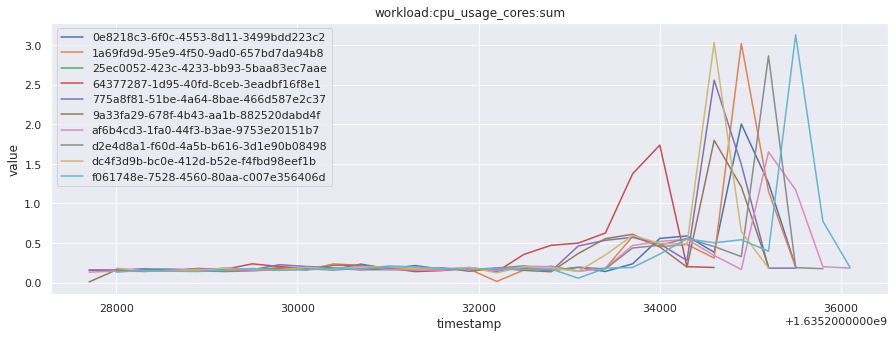

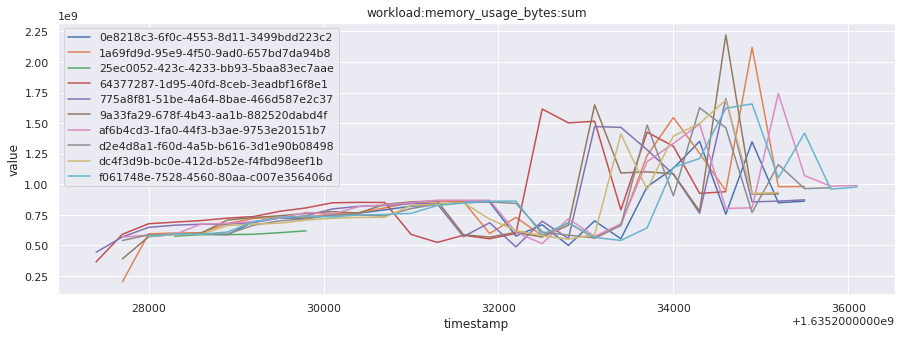

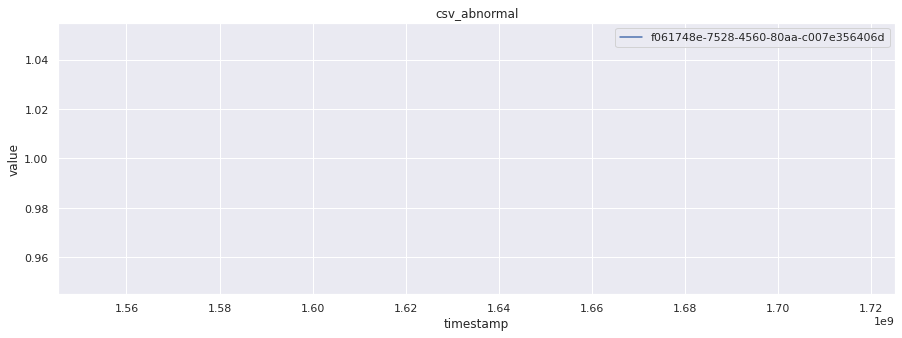

In [17]:
# visualize time series behavior across builds
for metric in all_metrics_df["__name__"].unique():
    plt.figure(figsize=(15, 5))

    metric_df = all_metrics_df[all_metrics_df["__name__"] == metric][
        ["_id", "timestamp", "value"]
    ]
    metric_df.set_index("timestamp").groupby("_id").value.plot(legend=True)

    plt.xlabel("timestamp")
    plt.ylabel("value")
    plt.legend(loc="best")
    plt.title(metric)
    plt.show()

In [18]:
# save the metrics as a static dataset to use in future
save_to_disk(
    all_metrics_df,
    "../../../data/raw/",
    f"telemetry-{query_eval_time.year}-{query_eval_time.month}-{query_eval_time.day}.parquet",
)

True

## Conclusion

In this notebook, we have :
- Collected all telemetry data corresponding to a given job and build.
- Understood how to interpret Prometheus data using an example metric.
- Collected all telemetry data from all timestamps for the top 10 most recent builds for a given job.
- Visualized what the general time series behavior of metrics looks like across builds.
- Saved the above data for further analysis.